In [1]:
%pylab inline
%config InlineBackend.figure_format = 'retina'

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
pip install --upgrade pip

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install pytorch-lightning

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install torch

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install ipywidgets

Note: you may need to restart the kernel to use updated packages.


In [6]:
%pip install -q plotly

Note: you may need to restart the kernel to use updated packages.


In [1]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

'nvidia-smi' is not recognized as an internal or external command,
operable program or batch file.


In [8]:
import os
import torch
os.environ['TORCH'] = torch.__version__
print(torch.__version__)

!pip install -q torch-scatter -f https://data.pyg.org/whl/torch-${TORCH}.html
!pip install -q torch-sparse -f https://data.pyg.org/whl/torch-${TORCH}.html
!pip install -q git+https://github.com/pyg-team/pytorch_geometric.git

!pip install torch-scatter torch-sparse torch_geometric

2.4.0+cpu


In [9]:
!pip install pygsp

In [2]:
from torch_geometric.nn.pool import radius
import torch
from torch import nn

import os
import time

V = lambda x: x.detach().cpu().numpy()
from numpy import newaxis, mean, savetxt
import networkx as nx
import numpy as np

import scipy
from scipy import spatial
from scipy.spatial import cKDTree
from scipy import sparse
from scipy.sparse import csgraph

import plotly.graph_objects as go

import random

#GCN -----------
from torch_geometric.nn import GCNConv

#GAT ----------
from torch_geometric.nn import GATConv

#GN -----------
from torch.nn import Sequential as Seq, Linear as Lin, ReLU
from torch_scatter import scatter_mean

from mpl_toolkits.mplot3d import Axes3D
import pygsp

torch.set_num_threads(1)

In [3]:
class KamadaKawaiLayout:
    def __init__(self, graph, dim=3, tol=1e-1, max_iter=1000, epsilon=1e-6):
        self.graph = graph
        self.dim = dim
        self.tol = tol
        self.max_iter = max_iter
        self.epsilon = epsilon
        self.positions = self.initialize_positions()
        self.distances = self.calculate_shortest_path_distances()
        self.spring_constants = self.calculate_spring_constants()

    def initialize_positions(self):
        pos = torch.rand((len(self.graph.nodes), self.dim), dtype=torch.float32)
        return pos

    def calculate_shortest_path_distances(self):
        length = dict(nx.all_pairs_shortest_path_length(self.graph))
        n = len(self.graph.nodes)
        distances = torch.zeros((n, n), dtype=torch.float32)

        for i, node_i in enumerate(self.graph.nodes):
            for j, node_j in enumerate(self.graph.nodes):
                if i != j:
                    distances[i, j] = length[node_i][node_j]
        
        return distances

    def calculate_spring_constants(self):
        with torch.no_grad():
            L = self.distances
            K = 1.0 / (L**2 + self.epsilon)  # Adding the epsilon to avoid division by 0
            K[torch.isinf(K)] = 0
        return K

    def compute_energy(self):
        diff = self.positions.unsqueeze(1) - self.positions.unsqueeze(0)
        dist = torch.sqrt((diff**2).sum(dim=-1) + self.epsilon) 
        energy = 0.5 * torch.sum(self.spring_constants * (dist - self.distances)**2)
        return energy

    def compute_gradient(self):
        diff = self.positions.unsqueeze(1) - self.positions.unsqueeze(0)
        dist = torch.sqrt((diff**2).sum(dim=-1) + self.epsilon) 
        term = self.spring_constants * (dist - self.distances) / dist
        gradient = torch.sum(term.unsqueeze(-1) * diff, dim=1)
        return gradient

    def minimize_energy(self):
        for _ in range(self.max_iter):
            energy = self.compute_energy()
            grad = self.compute_gradient()
            if torch.norm(grad) < self.tol:
                break
            self.positions -= 0.01 * grad  # Decreasing the step of the gratient

        return self.positions

    def layout(self):
        return self.minimize_energy()

    def plot_layout_3d_dynamic_pos(self, pos, dims=[0,1,2], edges=True, node_kws={}, edg_kws=dict(c='k', lw=1.0)):
        n = pos.shape[0]
        a = torch.tensor(nx.adjacency_matrix(self.graph).todense())
        edg = list(self.graph.edges())
        edge_index = torch.tensor(edg).T

        x_nodes = [pos[i][0] for i in range(n)]
        y_nodes = [pos[i][1] for i in range(n)]
        z_nodes = [pos[i][2] for i in range(n)]

        x_edges, y_edges, z_edges = [], [], []

        for edge in edg:
            x_coords = [pos[edge[0]][0], pos[edge[1]][0], None]
            x_edges += x_coords

            y_coords = [pos[edge[0]][1], pos[edge[1]][1], None]
            y_edges += y_coords

            z_coords = [pos[edge[0]][2], pos[edge[1]][2], None]
            z_edges += z_coords

        trace_edges = go.Scatter3d(x=x_edges, y=y_edges, z=z_edges, mode='lines',
                                   line=dict(color='black', width=2), hoverinfo='none')

        trace_nodes = go.Scatter3d(x=x_nodes, y=y_nodes, z=z_nodes, mode='markers',
                                   marker=dict(symbol='circle', size=3,
                                               colorscale=['lightgreen', 'magenta'],
                                               line=dict(color='black', width=0.5)),
                                   hoverinfo='text')

        axis = dict()
        layout_plotly = go.Layout(title="", width=650, height=625, showlegend=False,
                                  scene=dict(xaxis=dict(axis), yaxis=dict(axis), zaxis=dict(axis)),
                                  margin=dict(t=100), hovermode='closest')

        data = [trace_edges, trace_nodes]
        fig = go.Figure(data=data, layout=layout_plotly)
        fig.show()

In [6]:
# A Watts–Strogatz small-world graph with 100 nodes,
# each node is joined with its 4 nearest neighbors in a ring topology,
# probability of rewiring each edge is 0.1
G = nx.watts_strogatz_graph(100, 4, 0.1)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

4.023646831512451


In [7]:
# A Watts–Strogatz small-world graph with 500 nodes,
# Each node is joined with its 5 nearest neighbors in a ring topology,
# probability of rewiring each edge is 0.1

G = nx.watts_strogatz_graph(500, 5, 0.1)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

83.50670313835144


31.120898485183716


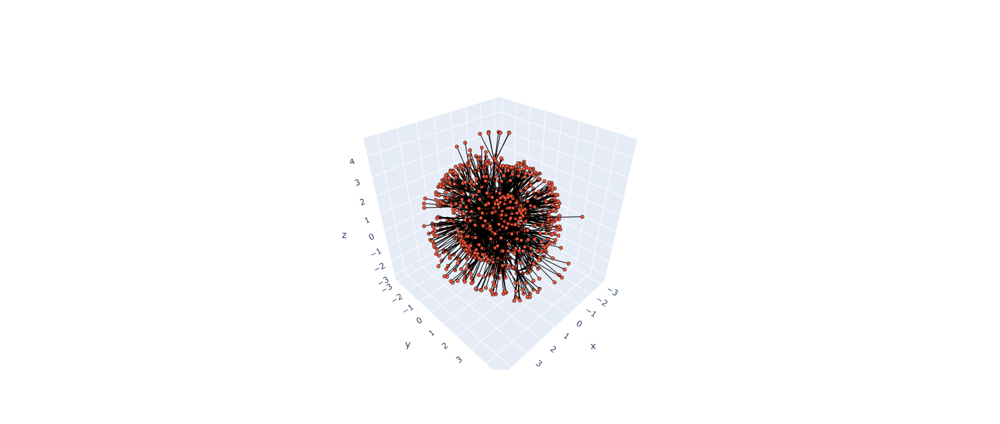

In [6]:
# A random undirected graph resembling the Internet AS network with 1000 nodes

G = nx.random_internet_as_graph(1000)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

68.53394985198975


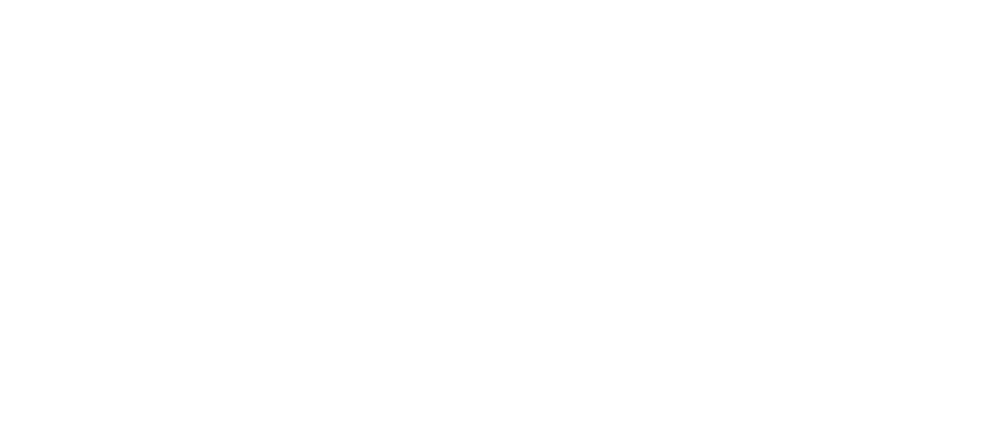

In [7]:
# A random undirected graph resembling the Internet AS network with 1500 nodes

G = nx.random_internet_as_graph(1500)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

207.1995141506195


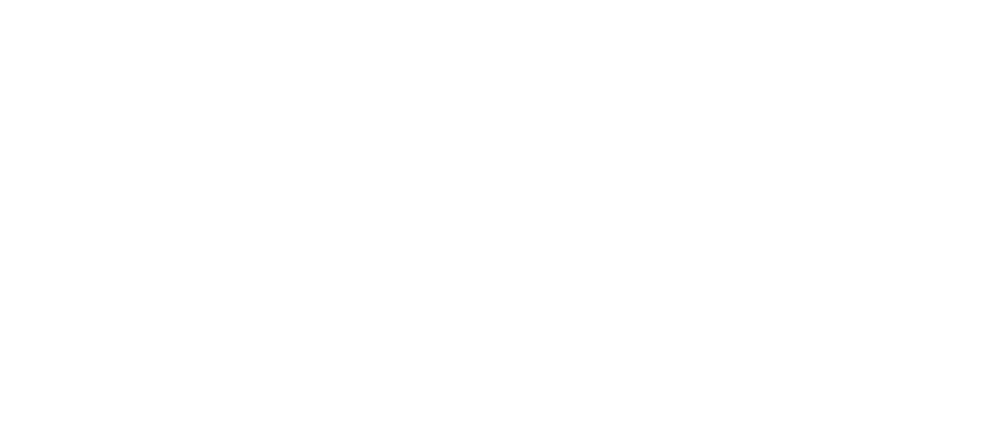

In [8]:
# A random undirected graph resembling the Internet AS network with 2000 nodes

G = nx.random_internet_as_graph(2000)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

In [9]:
# A random undirected graph resembling the Internet AS network with 2500 nodes

G = nx.random_internet_as_graph(2500)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

283.7449617385864


In [10]:
# A random undirected graph resembling the Internet AS network with 3000 nodes

G = nx.random_internet_as_graph(3000)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

510.4943974018097


In [11]:
# A hierarchically constructed Dorogovtsev-Goltsev-Mendes graph with n=7.
# Total number of nodes = 3 * (3**n + 1) / 2 - Total number of edges = 3 ** (n + 1)

G = nx.dorogovtsev_goltsev_mendes_graph(7)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

41.669514894485474


In [12]:
# A Barabasi Albert graph of 100 nodes is grown by attaching new nodes each with 
# 2 edges that are preferentially attached to existing nodes with a high degree

G = nx.barabasi_albert_graph(100, 2)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

0.3931748867034912


In [13]:
# A Barabasi Albert graph of 500 nodes is grown by attaching new nodes each with 
# 2 edges that are preferentially attached to existing nodes with a high degree

G = nx.barabasi_albert_graph(500, 2)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

8.786786556243896


In [14]:
# A random geometric graph model places 500 nodes uniformly at random in the unit cube.
# Two nodes are joined by an edge if the distance between the nodes is at most radius=0.1

G = nx.random_geometric_graph(500, 0.1)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

8.824539422988892


In [21]:
# A random geometric graph model places 1000 nodes uniformly at random in the unit cube.
# Two nodes are joined by an edge if the distance between the nodes is at most radius=0.05
# If you have an error here, try running it several times.
# The NetworkX often makes the graph with more than one component (we have such a problem only with this graph)

G = nx.random_geometric_graph(1000, 0.05)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

KeyError: 95

135.69911313056946


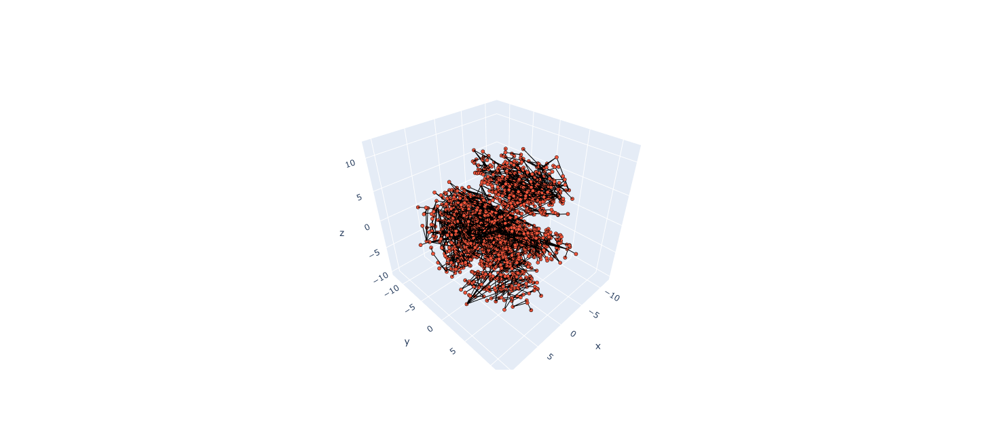

In [22]:
# A Binomial Tree of order 11

G = nx.binomial_tree(11)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

447.39012336730957


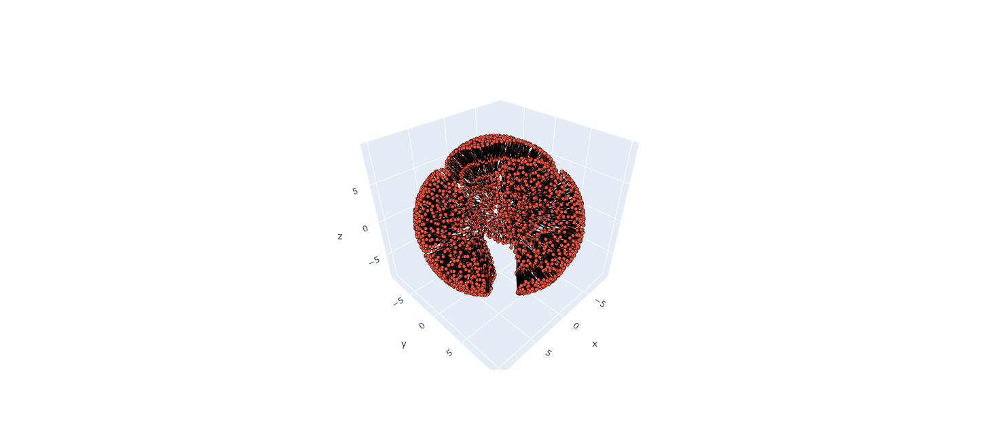

In [23]:
# A perfectly balanced 3-ary tree of height 7

G = nx.balanced_tree(3, 7)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

In [8]:
# A square-grid graph of size 30x30 nodes

G1 = nx.grid_graph(dim=[30, 30])

a = torch.tensor(nx.adjacency_matrix(G1).todense())
nV=900

edg = []
for i in range(nV):
    for j in range(nV):
        if a[i][j] != 0:
            edg.append([i, j])

edge_index = torch.tensor(edg).T

# the grid_graph has some problems with edges so we need to make some additional corrections

G = nx.Graph()
G.add_nodes_from(range(nV))
G.add_edges_from(edg)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

160.3447289466858


In [25]:
# A hexagon-grid graph of size 31x30 nodes

def create_hexagonal_grid(n, m):
    v = n * m
    edgList = []
    hexGrid = np.zeros((n, m), dtype=int)
    k = 0
    for i in range(n):
        for j in range(m):
            hexGrid[i][j] = k
            k += 1

    a = np.zeros((v, v), dtype=int)

    for i in range(n-1):
        for j in range(m):
            a[hexGrid[i][j]][hexGrid[i+1][j]] = 1

    for i in range(1, n):
        for j in range(m):
            a[hexGrid[i][j]][hexGrid[i-1][j]] = 1

    for i in range(n):
        for j in range((i%2), m-(i%2)):
            if (i+j)%2==0:
                a[hexGrid[i][j]][hexGrid[i][j+1]] = 1
            else:
                a[hexGrid[i][j]][hexGrid[i][j-1]] = 1

    return torch.tensor(a), v

n = 31
m = 30
a, nV = create_hexagonal_grid(n, m)

edg = []
for i in range(nV):
    for j in range(nV):
        if a[i][j] != 0:
            edg.append([i, j])

edge_index = torch.tensor(edg).T

G = nx.Graph()
G.add_nodes_from(range(nV))
G.add_edges_from(edg)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

25.807456016540527


In [26]:
# A cubic-grid graph of size 5x5x5 nodes

G1 = nx.grid_graph(dim=[5, 5, 5])

a = torch.tensor(nx.adjacency_matrix(G1).todense())
nV=125

edg = []
for i in range(nV):
    for j in range(nV):
        if a[i][j] != 0:
            edg.append([i, j])

edge_index = torch.tensor(edg).T

G = nx.Graph()
G.add_nodes_from(range(nV))
G.add_edges_from(edg)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

0.34845399856567383


In [27]:
# A cubic-grid graph of size 10x10x10 nodes

G1 = nx.grid_graph(dim=[10, 10, 10])

a = torch.tensor(nx.adjacency_matrix(G1).todense())
nV=1000

edg = []
for i in range(nV):
    for j in range(nV):
        if a[i][j] != 0:
            edg.append([i, j])

edge_index = torch.tensor(edg).T

G = nx.Graph()
G.add_nodes_from(range(nV))
G.add_edges_from(edg)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

20.494248867034912


In [28]:
# A tetrahedral-grid graph with 15 nodes on one edge

def create_tetrahedral_pyramid(n):
    edgList=[]
    pyramid=np.zeros((n,n,n), dtype=int)
    temp=0
    for i in range(n):
      for j in range(i+1):
        for k in range(j+1):
          pyramid[i,j,k]=temp
          temp+=1
      # print(i, pyramid[i])
    a = np.zeros((temp, temp), dtype=int)
    for i in range(n-1):
      for j in range(i+1):
        for k in range(j+1):
          # edgList.append([pyramid[i,j,k], pyramid[i+1,j,k]], [pyramid[i+1,j,k], pyramid[i,j,k]], [pyramid[i,j,k], pyramid[i+1,j+1,k]], [pyramid[i+1,j+1,k], pyramid[i,j,k]], [pyramid[i,j,k], pyramid[i+1,j+1,k+1]], [pyramid[i+1,j+1,k+1], pyramid[i,j,k]])
          a[pyramid[i,j,k]][pyramid[i+1,j,k]]=1
          a[pyramid[i+1,j,k]][pyramid[i,j,k]]=1
          a[pyramid[i,j,k]][pyramid[i+1,j+1,k]]=1
          a[pyramid[i+1,j+1,k]][pyramid[i,j,k]]=1
          a[pyramid[i,j,k]][pyramid[i+1,j+1,k+1]]=1
          a[pyramid[i+1,j+1,k+1]][pyramid[i,j,k]]=1
    for i in range(n):
      for j in range(i):
        for k in range(j+1):
          # edgList.append([pyramid[i,j,k], pyramid[i,j+1,k]], [pyramid[i,j+1,k], pyramid[i,j,k]], [pyramid[i,j,k], pyramid[i,j+1,k+1]], [pyramid[i,j+1,k+1], pyramid[i,j,k]])
          a[pyramid[i,j,k]][pyramid[i,j+1,k]]=1
          a[pyramid[i,j+1,k]][pyramid[i,j,k]]=1
          a[pyramid[i,j,k]][pyramid[i,j+1,k+1]]=1
          a[pyramid[i,j+1,k+1]][pyramid[i,j,k]]=1
      for j in range(i+1):
        for k in range(j):
          # edgList.append([pyramid[i,j,k], pyramid[i,j,k+1]], [pyramid[i,j,k+1], pyramid[i,j,k]])
          a[pyramid[i,j,k]][pyramid[i,j,k+1]]=1
          a[pyramid[i,j,k+1]][pyramid[i,j,k]]=1
    return torch.tensor(a), temp


n=15
a, nV = create_tetrahedral_pyramid(n)
print(a)
edg=[]
identity = torch.eye(nV)
for i in range(nV):
    for j in range(nV):
        if a[i][j]!=0:
          edg += [[i,j]]

print(np.shape(edg))

edge_index = torch.tensor(edg).T

G = nx.Graph()
G.add_nodes_from(range(nV))
G.add_edges_from(edg)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

tensor([[0, 1, 1,  ..., 0, 0, 0],
        [1, 0, 1,  ..., 0, 0, 0],
        [1, 1, 0,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 1, 0],
        [0, 0, 0,  ..., 1, 0, 1],
        [0, 0, 0,  ..., 0, 1, 0]])
(6720, 2)
8.175040483474731


In [29]:
# A tube graph with h = 50 nodes, base length = 20 nodes

n = 20
m = 50

nV=1000

v=n*m

a = torch.zeros(v, v)

for i in range(m):
    for j in range(1, n-1):
      a[i*n+j][i*n+j+1] = 1
      a[i*n+j][i*n+j-1] = 1

    a[i*n][i*n+1] = 1
    a[i*n][i*n+n-1] = 1
    a[i*n+n-1][i*n] = 1
    a[i*n+n-1][i*n+n-2] = 1

for i in range(m-1):
    for j in range(n):
      a[i*n+j][i*n+j+n] = 1
for i in range(1, m):
    for j in range(n):
      a[i*n+j][i*n+j-n] = 1

results = []

edg=[]
identity = torch.eye(v)
for i in range(v):
    for j in range(v):
        if a[i][j]!=0:
          edg += [[i,j]]
print(np.shape(edg))

edge_index = torch.tensor(edg).T

G = nx.Graph()
G.add_nodes_from(range(nV))
G.add_edges_from(edg)

# Starting the time measurement
start_time = time.time()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions of the nodes
positions = kk_layout.layout()

# Ending the time measurement
end_time = time.time()

# Calculating and printing the working time
elapsed_time = end_time - start_time
print(elapsed_time)

# Drawing the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

(3960, 2)
30.914658546447754
